Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Found 5 image(s) in '/content/drive/MyDrive/fields'

Processing 1.JPG...


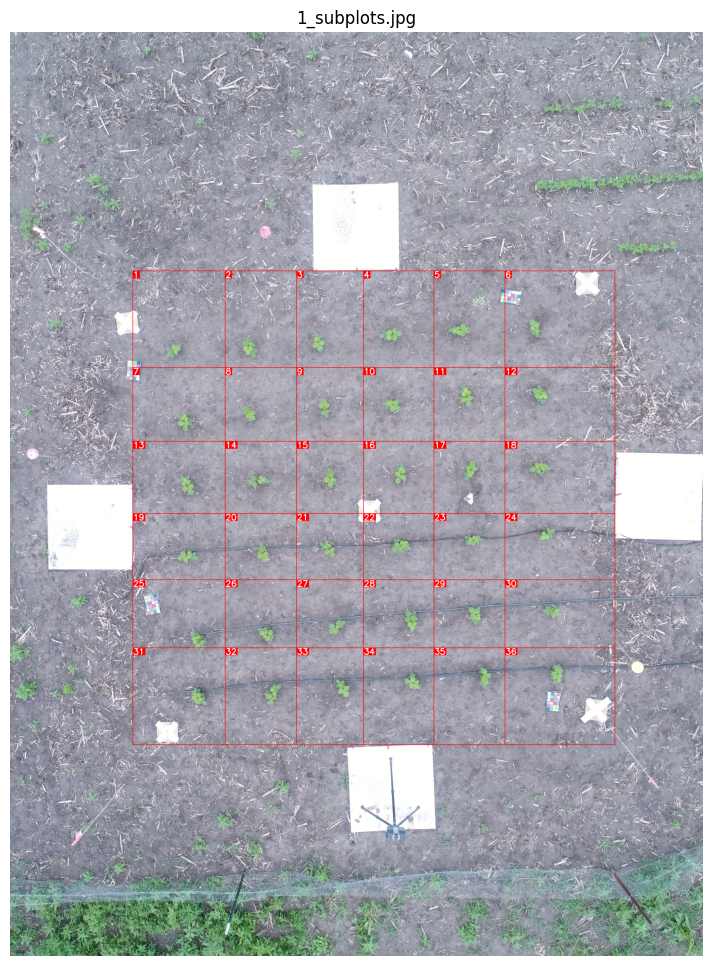

  Saved -> /content/drive/MyDrive/fields_output/1_subplots.jpg
Processing 2.JPG...


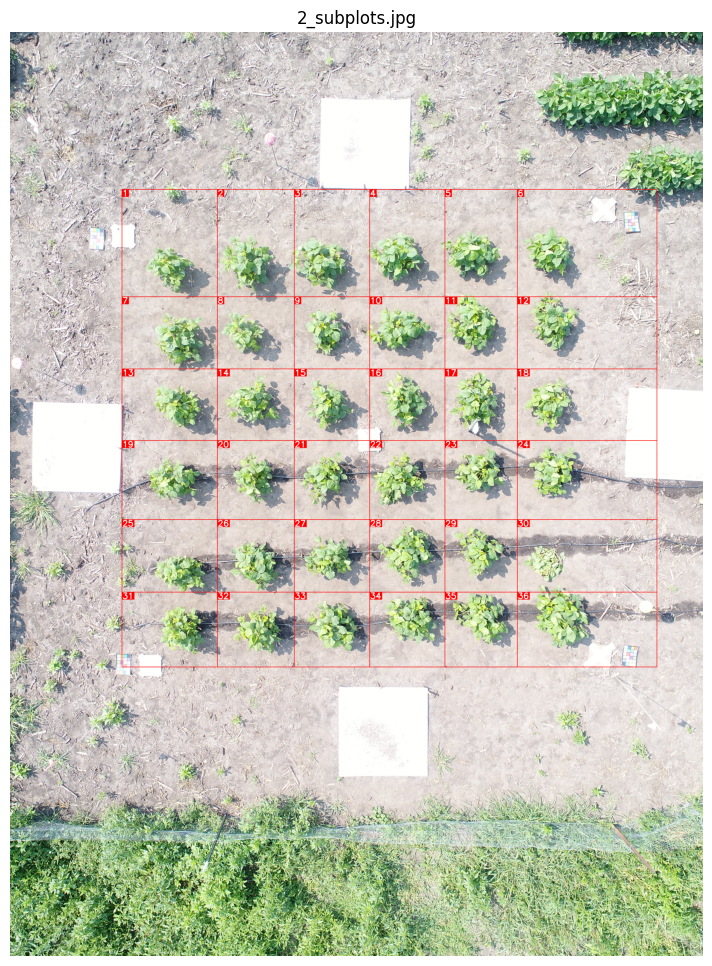

  Saved -> /content/drive/MyDrive/fields_output/2_subplots.jpg
Processing 3.JPG...


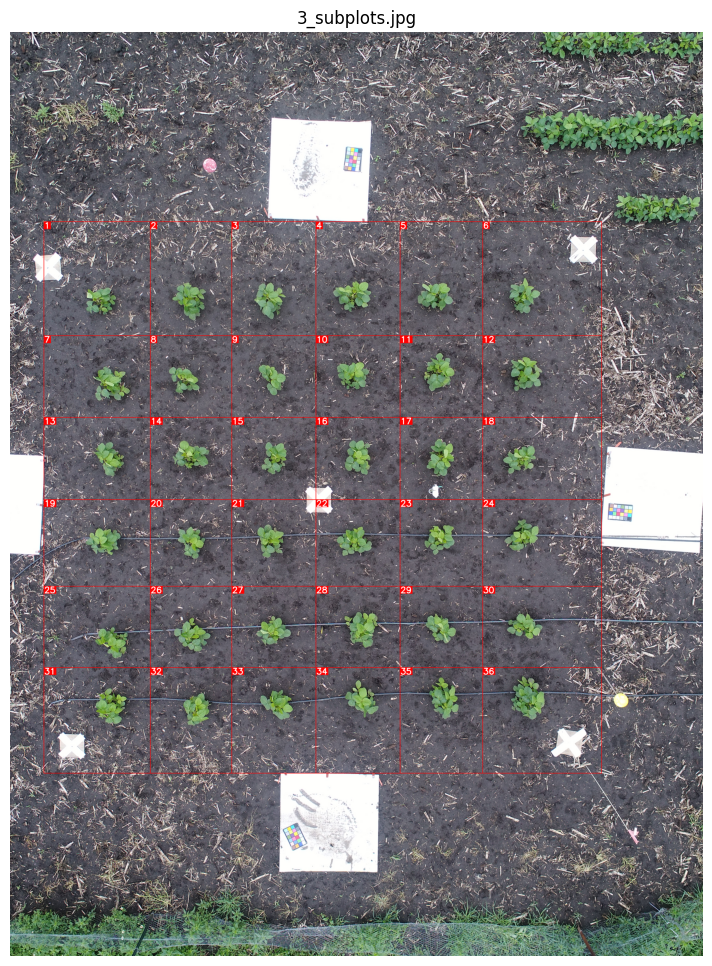

  Saved -> /content/drive/MyDrive/fields_output/3_subplots.jpg
Processing 4.JPG...


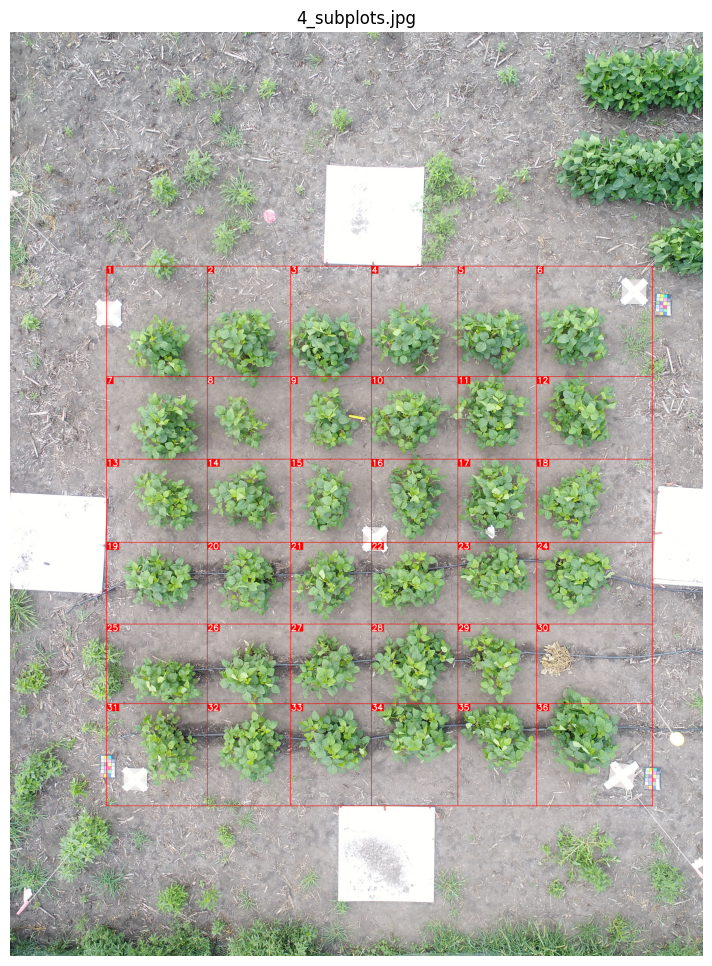

  Saved -> /content/drive/MyDrive/fields_output/4_subplots.jpg
Processing 5.JPG...


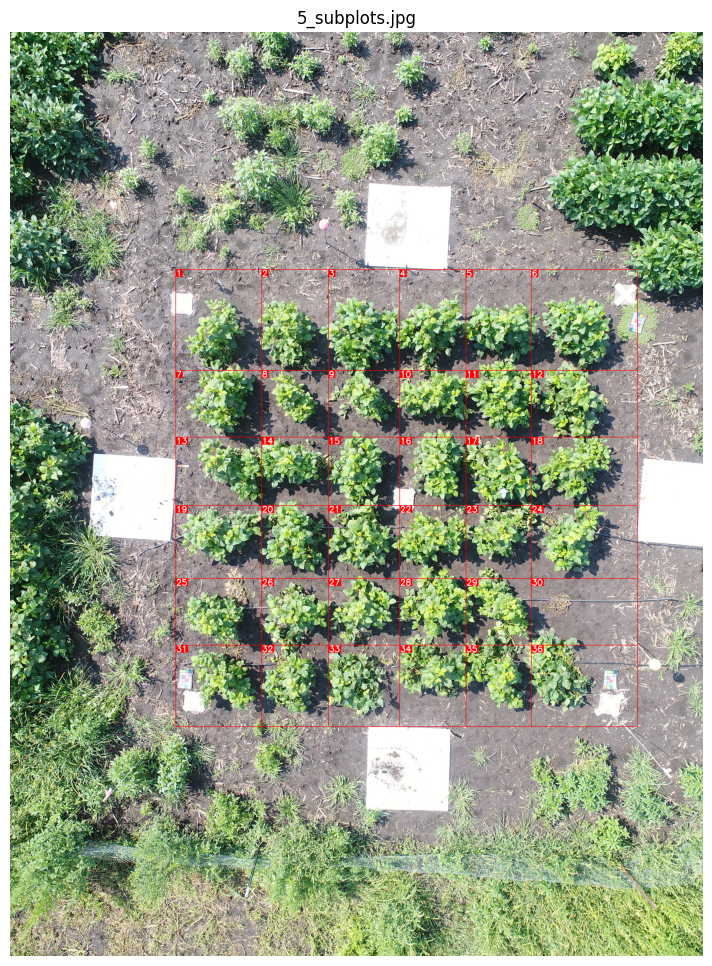

  Saved -> /content/drive/MyDrive/fields_output/5_subplots.jpg

Done!


In [1]:

from google.colab import drive
drive.mount('/content/drive')

import cv2
import numpy as np
from scipy.signal import find_peaks
import matplotlib.pyplot as plt
import os

IMAGE_DIR  = '/content/drive/MyDrive/fields'
OUTPUT_DIR = '/content/drive/MyDrive/fields_output'
N_ROWS, N_COLS = 6, 6

os.makedirs(OUTPUT_DIR, exist_ok=True)


def get_grid_roi(img):
    h, w = img.shape[:2]
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    white = cv2.inRange(hsv, np.array([0, 0, 200]), np.array([180, 30, 255]))
    white = cv2.morphologyEx(white, cv2.MORPH_OPEN, np.ones((15, 15), np.uint8))
    contours, _ = cv2.findContours(white, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    panels = []
    for c in contours:
        area = cv2.contourArea(c)
        if not (h * w * 0.001 < area < h * w * 0.05):
            continue
        x, y, bw, bh = cv2.boundingRect(c)
        if max(bw, bh) / (min(bw, bh) + 1) < 3.5:
            panels.append({'cx': x+bw//2, 'cy': y+bh//2,
                           'x1': x, 'y1': y, 'x2': x+bw, 'y2': y+bh})

    if len(panels) >= 4:
        panels = sorted(panels, key=lambda p: p['cx']**2 + p['cy']**2)[:4]
        by_y = sorted(panels, key=lambda p: p['cy'])
        top, bot = by_y[0], by_y[-1]
        left, right = sorted(by_y[1:3], key=lambda p: p['cx'])
        x1, y1 = left['x2'], top['y2']
        x2, y2 = right['x1'], bot['y1']
        if x2 - x1 > w * 0.3 and y2 - y1 > h * 0.3:
            return x1, y1, x2, y2

    print("  Panels not found cleanly -- using inner-image fallback.")
    return int(w*0.15), int(h*0.15), int(w*0.85), int(h*0.85)


def get_grid_lines(roi_img, n_rows, n_cols):
    h, w = roi_img.shape[:2]
    hsv = cv2.cvtColor(roi_img, cv2.COLOR_BGR2HSV)

    green = cv2.inRange(hsv, np.array([25, 40, 30]), np.array([95, 255, 220]))
    green = cv2.morphologyEx(green, cv2.MORPH_CLOSE, np.ones((5, 5), np.uint8), iterations=2)
    green = cv2.morphologyEx(green, cv2.MORPH_OPEN,  np.ones((5, 5), np.uint8), iterations=1)

    def peaks_from_projection(projection, n):
        smooth = np.convolve(projection.astype(float),
                             np.ones(max(3, len(projection)//60)) / max(3, len(projection)//60),
                             mode='same')
        peaks, _ = find_peaks(smooth, distance=len(smooth)//(n*2), height=smooth.max()*0.05)
        if len(peaks) >= n:
            return np.sort(peaks[np.argsort(smooth[peaks])[-n:]])
        return np.linspace(0, len(smooth)-1, n, dtype=int)

    def edges_from_peaks(peaks, length):
        return [0] + [(peaks[i]+peaks[i+1])//2 for i in range(len(peaks)-1)] + [length]

    row_edges = edges_from_peaks(peaks_from_projection(green.sum(axis=1), n_rows), h)
    col_edges = edges_from_peaks(peaks_from_projection(green.sum(axis=0), n_cols), w)
    return row_edges, col_edges


def annotate_and_save(img, x1, y1, row_edges, col_edges, out_path):
    out   = img.copy()
    font  = cv2.FONT_HERSHEY_SIMPLEX
    scale = max(0.4, min(img.shape[:2]) / 2500)
    thick = max(1, int(scale * 2.5))

    for r in range(N_ROWS):
        for c in range(N_COLS):
            r1, r2 = y1 + row_edges[r], y1 + row_edges[r+1]
            c1, c2 = x1 + col_edges[c], x1 + col_edges[c+1]
            label  = str(r * N_COLS + c + 1)
            cv2.rectangle(out, (c1, r1), (c2, r2), (0, 0, 255), 2)
            (tw, th), _ = cv2.getTextSize(label, font, scale, thick)
            cv2.rectangle(out, (c1, r1), (c1+tw+4, r1+th+6), (0, 0, 255), -1)
            cv2.putText(out, label, (c1+2, r1+th+2), font, scale, (255, 255, 255), thick)

    cv2.imwrite(out_path, out)
    plt.figure(figsize=(10, 12))
    plt.imshow(cv2.cvtColor(out, cv2.COLOR_BGR2RGB))
    plt.title(os.path.basename(out_path))
    plt.axis('off')
    plt.show()


image_files = sorted([
    os.path.join(IMAGE_DIR, f) for f in os.listdir(IMAGE_DIR)
    if f.lower().endswith(('.jpg', '.jpeg', '.png', '.tif', '.tiff'))
])

print(f"Found {len(image_files)} image(s) in '{IMAGE_DIR}'\n")

for path in image_files:
    name = os.path.basename(path)
    print(f"Processing {name}...")
    img = cv2.imread(path)
    if img is None:
        print(f"  Could not read {path}, skipping.")
        continue
    x1, y1, x2, y2      = get_grid_roi(img)
    row_edges, col_edges = get_grid_lines(img[y1:y2, x1:x2], N_ROWS, N_COLS)
    out_path = os.path.join(OUTPUT_DIR, os.path.splitext(name)[0] + '_subplots.jpg')
    annotate_and_save(img, x1, y1, row_edges, col_edges, out_path)
    print(f"  Saved -> {out_path}")

print("\nDone!")